**note this version requires scanpy 1.10 or above.**   
for that currently need a gpu instance (with torch_on_gpu env) 

In [1]:
import scanpy 
scanpy.__version__

'1.10.4'

In [2]:

%load_ext autoreload
%autoreload 2

In [3]:
import glob, sys, os
from pprint import pprint
import matplotlib.pyplot as plt
import numpy as np
import tqdm
import pandas as pd
import scanpy as sc
import logging
# Setup logging
logging.basicConfig(level=logging.INFO)


sys.path.append('/home/shuonan.chen/scratch_shuonan/code/pons_merfish_pipeline/processing/func/')
from prepare_img_utils import *
from utils import get_paths
paths = get_paths()
print(paths.keys())

dict_keys(['code_root', 'data_root', 'package_root'])


In [4]:
# Define constants

globalscaling = 32
# save_destination = '/allen/aind/scratch/shuonan.chen/code/pons_merfish_pipeline/processing/'  # should be cwd
# main_dir = '/allen/aind/scratch/shuonan.chen/pons_images/'  # where raw images are 

all_tifs = (paths['data_root'] + '*/' + 'analyzed_data/*/region_*/images/*.tif')
name_of_slice_all = [[s for s in f.split('/') if "Mouse" in s][0] for f in glob.glob(all_tifs)]
name_of_slice_all = np.unique(name_of_slice_all)
invalid_slices = [name_of_slice_all[0],name_of_slice_all[15]]

In [5]:
invalid_slices

[np.str_('MouseC_C1'), np.str_('MouseF_F5')]

In [10]:
name_of_slice = 'MouseC_C5'
globalscaling = 32

In [11]:
verbose = False
thisdircheck = (paths['data_root'] + name_of_slice + '/' + 'analyzed_data/*/region_*/')
alltifregions = np.array([[s for s in m.split('/') if 'region' in s][0] for m in glob.glob(thisdircheck + '/images/*.tif')])
values, counts = np.unique(alltifregions, return_counts=True)
region_chosen = values[np.argmax(counts)]
thisdircheck = (paths['data_root'] + name_of_slice + '/' + f'analyzed_data/*/{region_chosen}/')

cell_loc_path = glob.glob(thisdircheck + 'cell_metadata.csv')[0]
countmatrix_path = glob.glob(thisdircheck+'cell_by_gene.csv')[0]

slice_id = cell_loc_path.split('/')[-3]    
sc_factor_1,sc_factor_2, shift = scaling_factor(pix_tran_filepath = paths['data_root']+f'/pons_csvs/{slice_id}/{region_chosen}/images/micron_to_mosaic_pixel_transform.csv')

foo = pd.read_csv(cell_loc_path, index_col=0).sort_index()
cell_pos_orig = foo[['center_x','center_y']]*np.array((sc_factor_1,sc_factor_2)) + shift
cell_pos = (foo[['center_x','center_y']]*np.array((sc_factor_1,sc_factor_2)) + shift)/globalscaling

tif_img = get_tifimage(thisdircheck, globalscaling=globalscaling)


In [12]:
sc_factor_1,sc_factor_2

(np.float64(9.259382247924803), np.float64(9.259430885314941))

In [9]:
np.ptp(cell_pos_orig.values, 0)

array([67979.9408545 , 40754.94412814])

In [17]:
np.ptp(cell_pos_orig.values, 0)*9.25/10000 #(mm)

array([0.73491828, 0.44059399])

In [17]:
tif_img = get_tifimage(thisdircheck, globalscaling=globalscaling)

In [22]:
image_dir = glob.glob(thisdircheck + 'images/*.tif')
image_dir

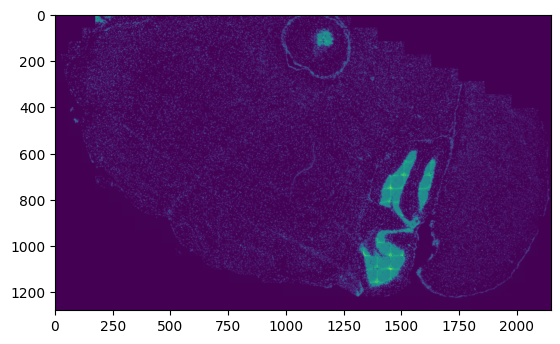

In [24]:

tif_img = skimage.transform.rescale(tifffile.imread(image_dir[5], maxworkers=-1), 1/globalscaling, order=0)
    
plt.imshow(tif_img)

/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12040. The TBB threading layer is disabled.
  warnings.warn(problem)


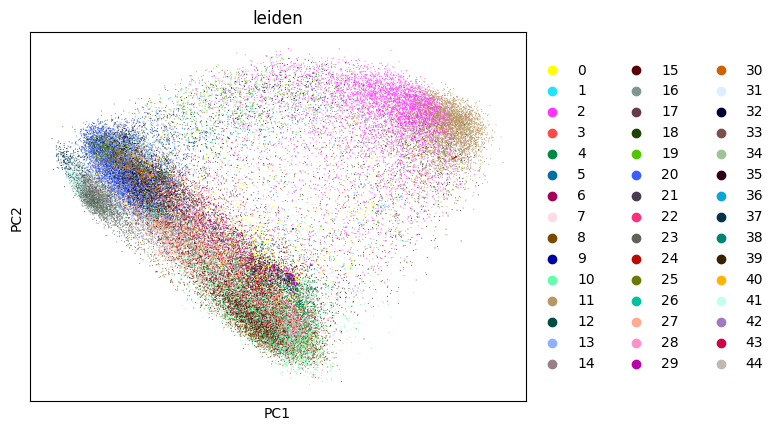

In [8]:
adata_mer = run_denovo_cluster(countmatrix_path)
# save_filt_neuron_df(cell_pos_orig, adata_mer, outputfile=paths['code_root'] + f'/filt_neurons/filt_neurons_{name_of_slice}.csv', verbose=False)


In [9]:
adata_mer.X.shape

(61144, 385)

In [10]:
cell_pos.shape

(61144, 2)

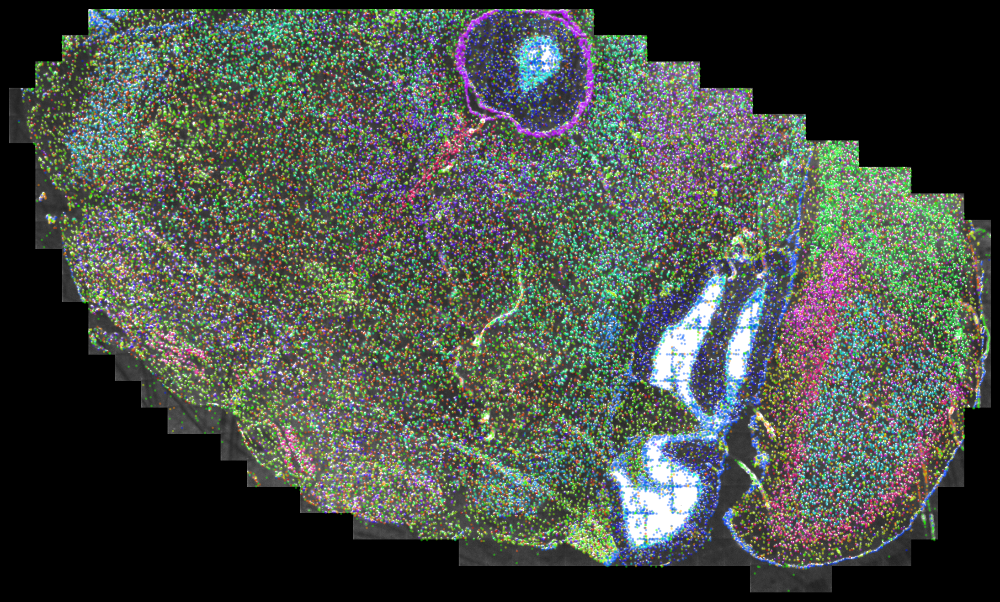

In [18]:
plot_jpg(cell_pos, adata_mer, tif_img, dpi=200, save_bool=False, verbose=False, delta = 0, savefilename='./foo_dpi200.jpg')


In [29]:
create_image_xml(name_of_slice, width=tif_img.shape[0], height=tif_img.shape[1], save_destination=paths['code_root'], verbose=False)
logging.info(f'done for mouse: {name_of_slice}')

INFO:root:done for mouse: MouseZM_ZM7p2


/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


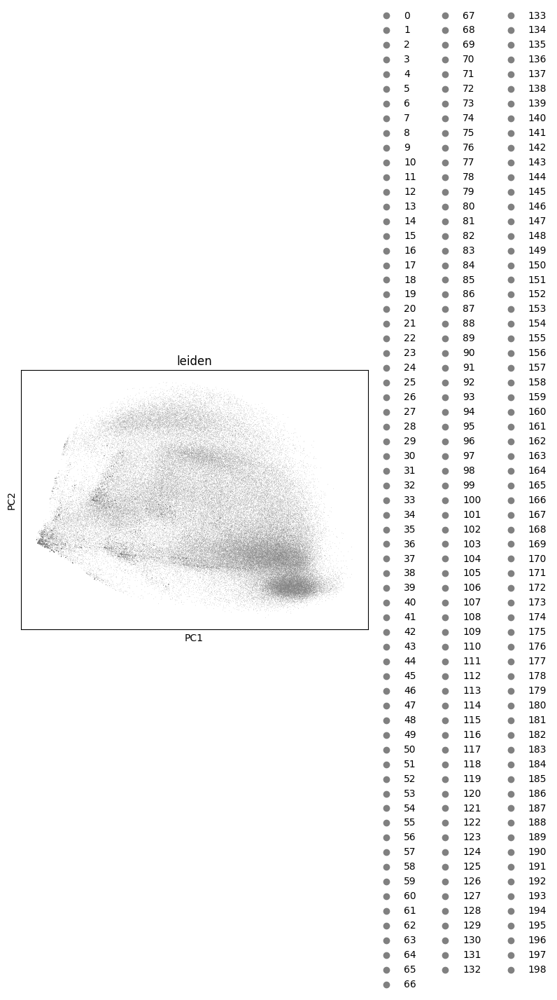

INFO:root:done for mouse: MouseC_C2
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


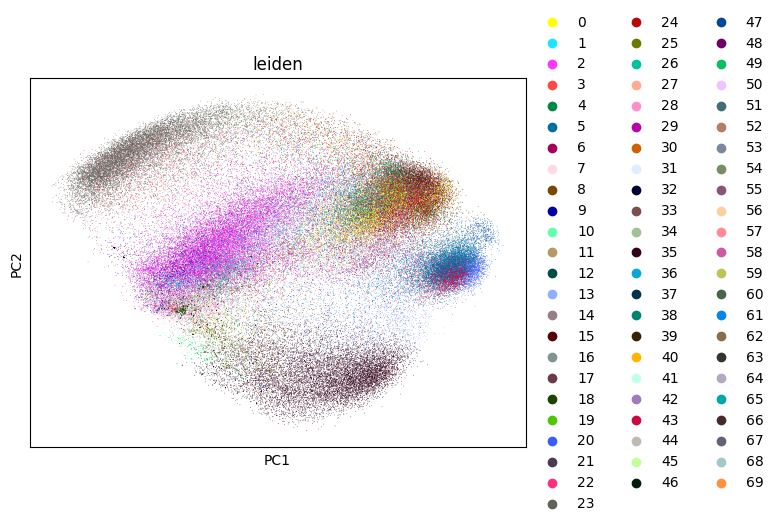

INFO:root:done for mouse: MouseC_C3
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


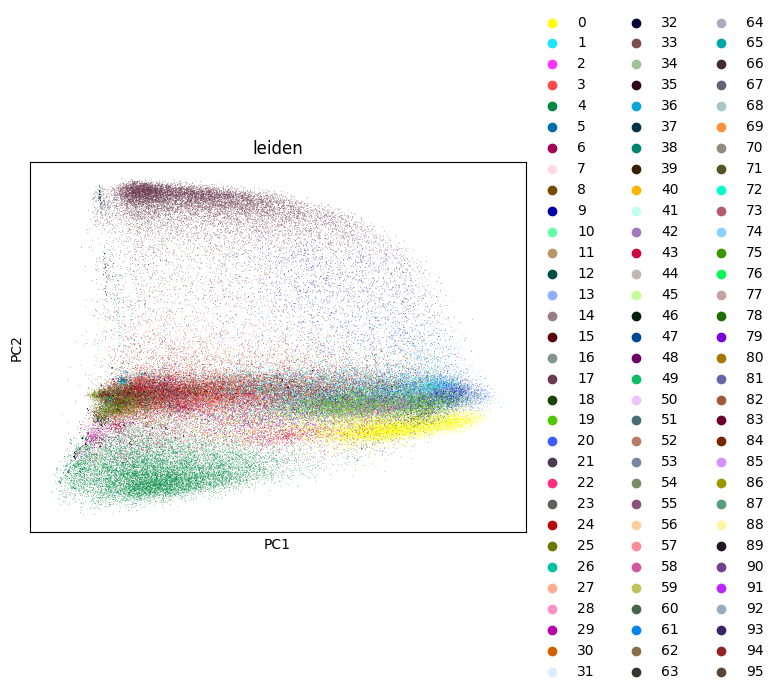

INFO:root:done for mouse: MouseC_C4
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


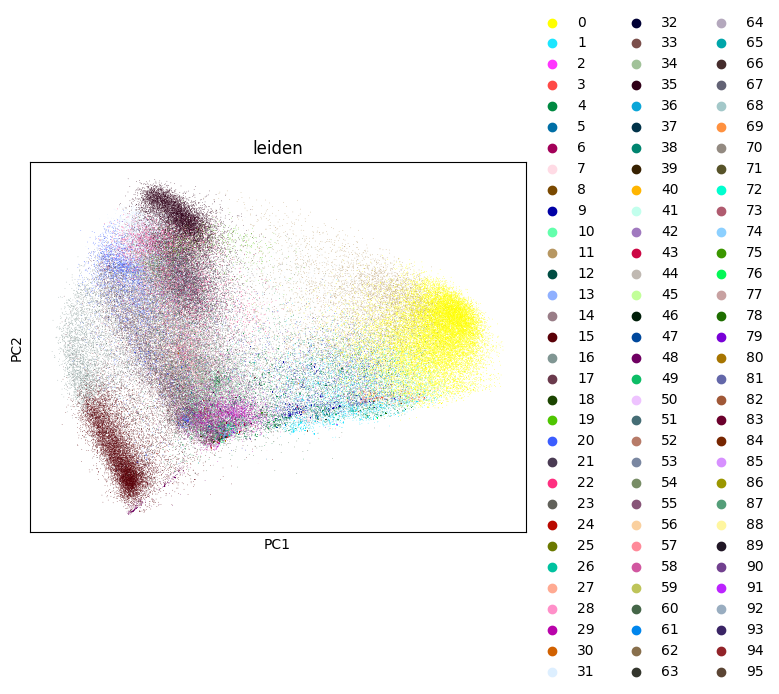

INFO:root:done for mouse: MouseC_C5
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


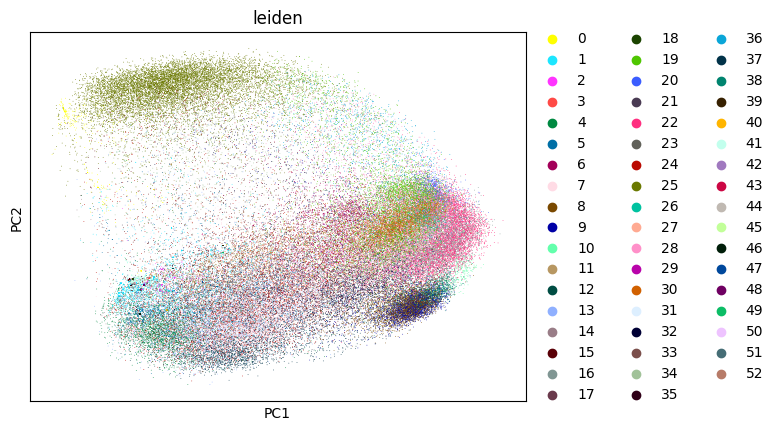

INFO:root:done for mouse: MouseEg_B3
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


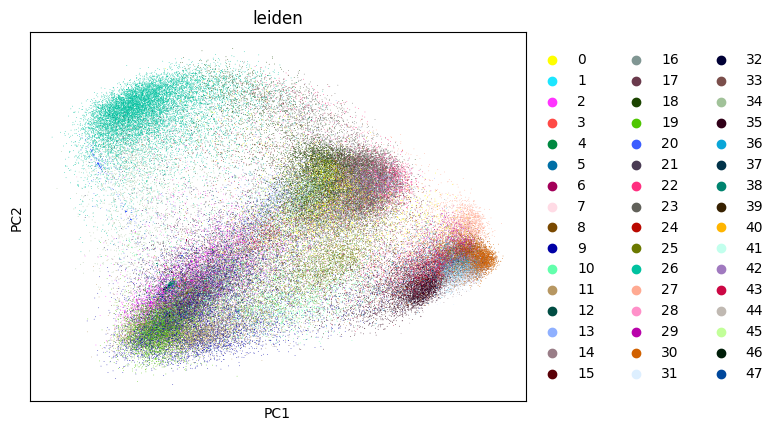

INFO:root:done for mouse: MouseEg_Eg1
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


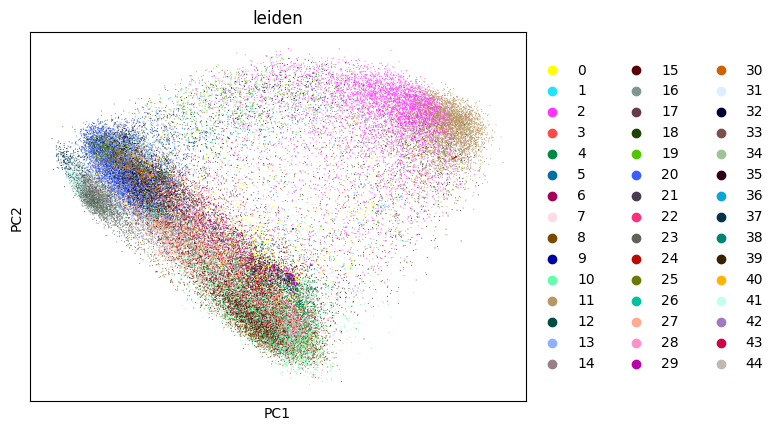

INFO:root:done for mouse: MouseEg_Eg2
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


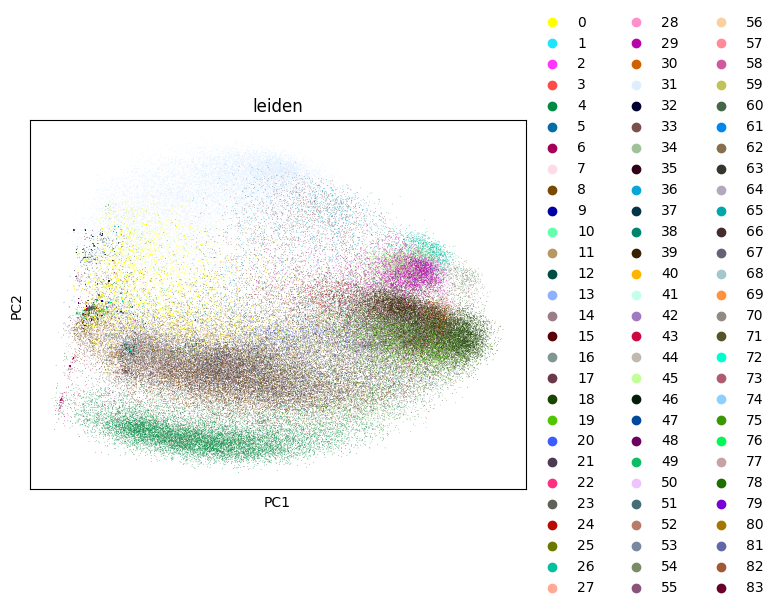

INFO:root:done for mouse: MouseEg_Eg3
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


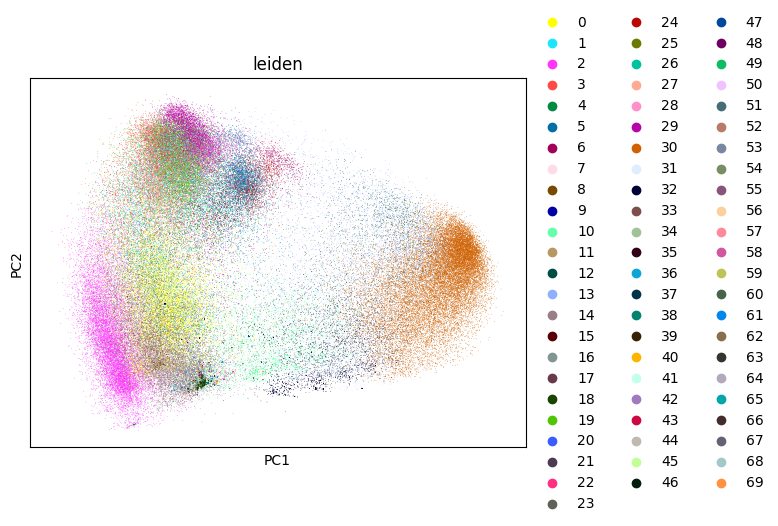

INFO:root:done for mouse: MouseEg_Eg4
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


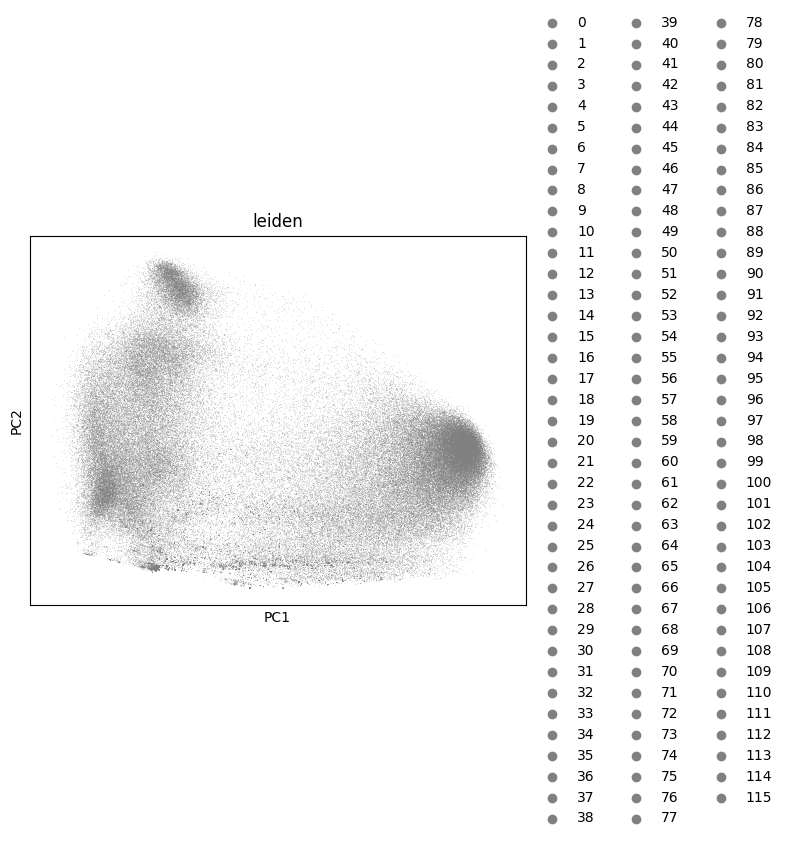

INFO:root:done for mouse: MouseEg_Eg5
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


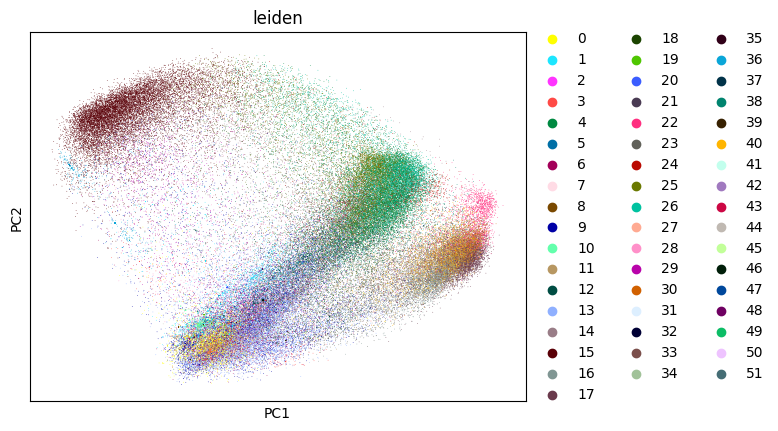

INFO:root:done for mouse: MouseF_F1
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


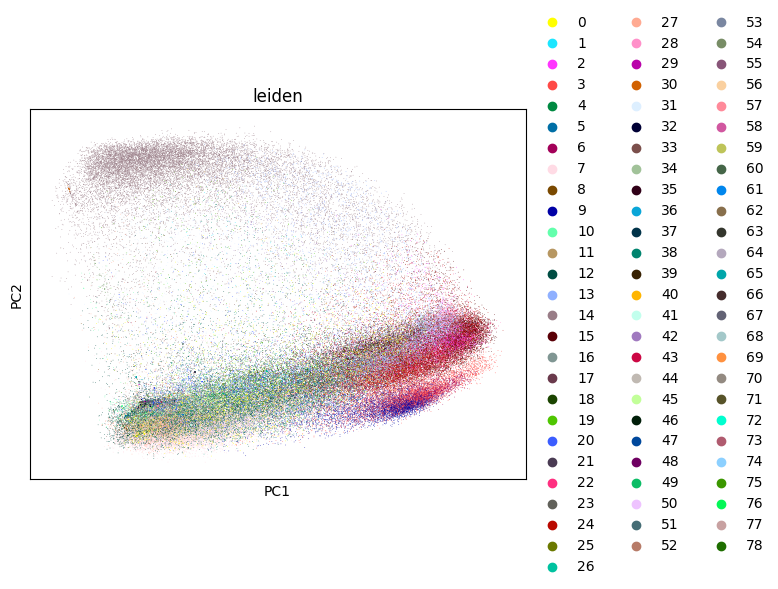

INFO:root:done for mouse: MouseF_F2
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


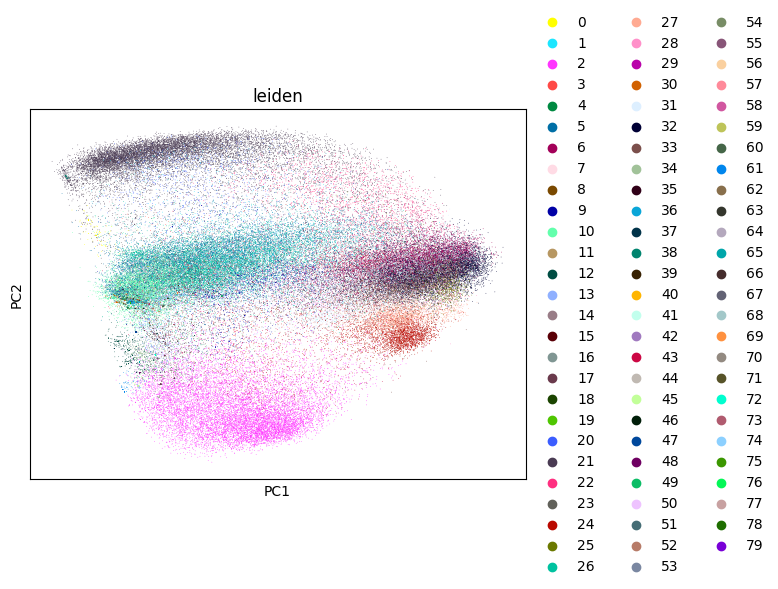

INFO:root:done for mouse: MouseF_F3
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


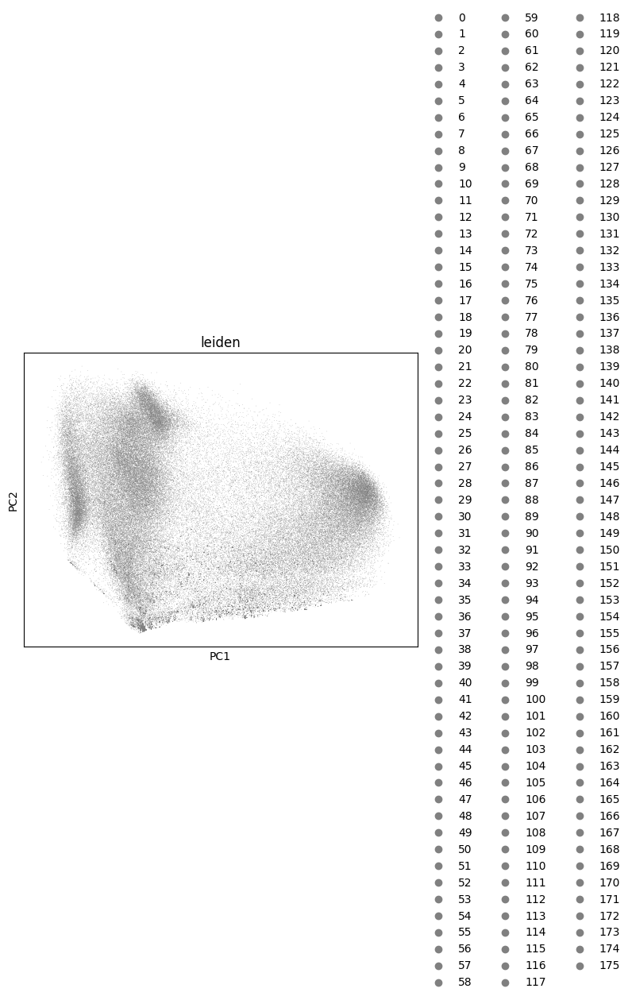

INFO:root:done for mouse: MouseF_F4
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


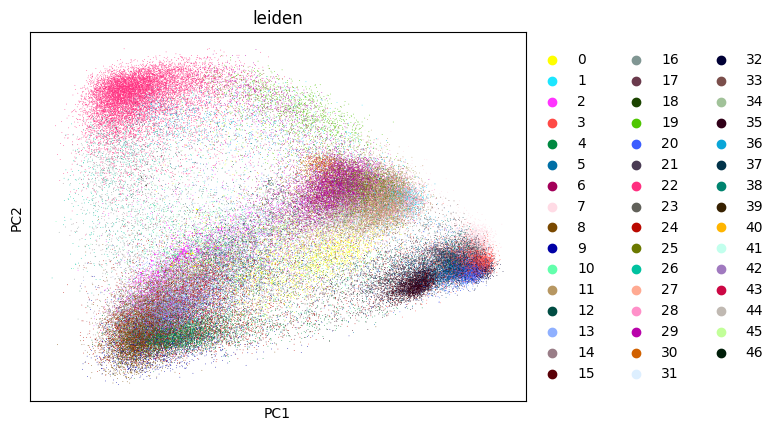

INFO:root:done for mouse: MouseZM_ZM0
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


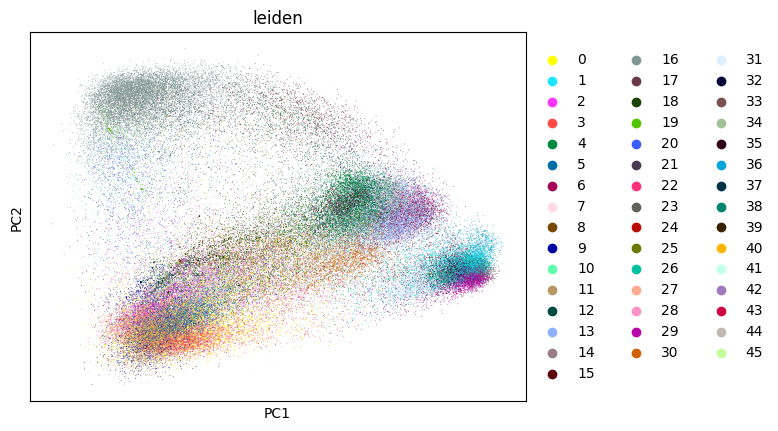

INFO:root:done for mouse: MouseZM_ZM1
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


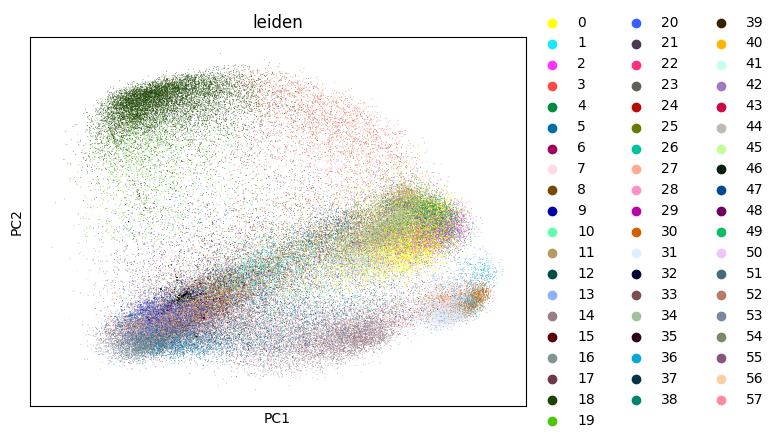

INFO:root:done for mouse: MouseZM_ZM2
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


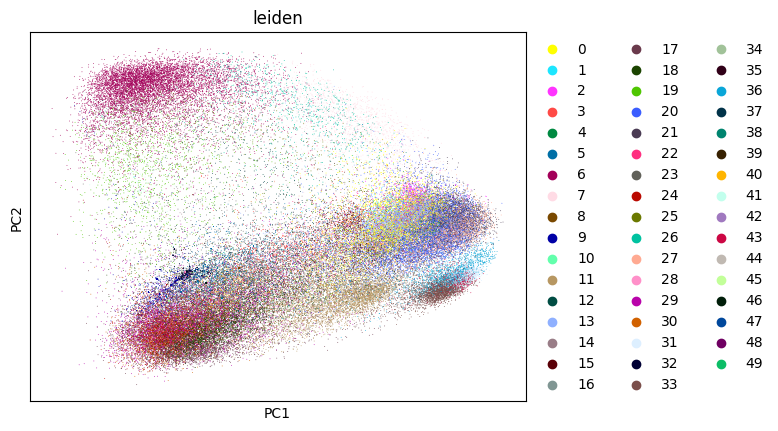

INFO:root:done for mouse: MouseZM_ZM3
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


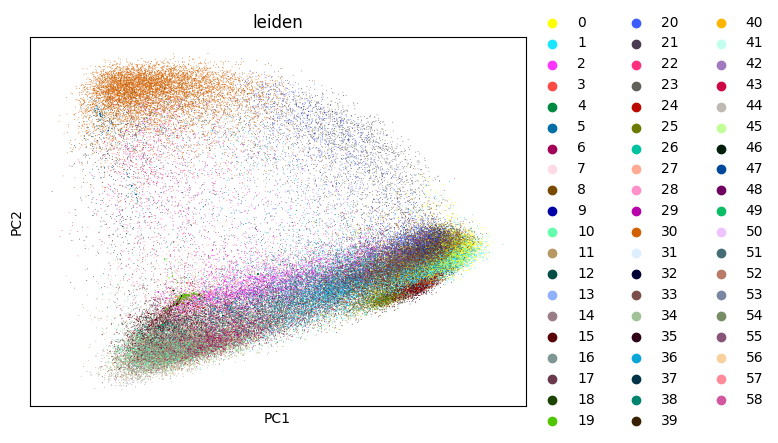

INFO:root:done for mouse: MouseZM_ZM4
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


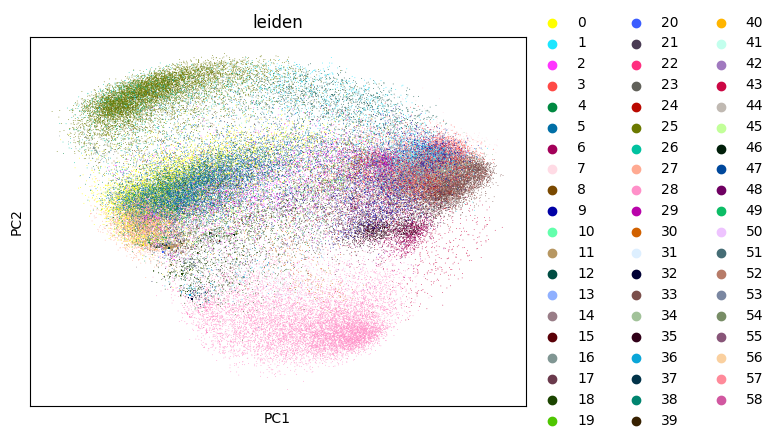

INFO:root:done for mouse: MouseZM_ZM5p1
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


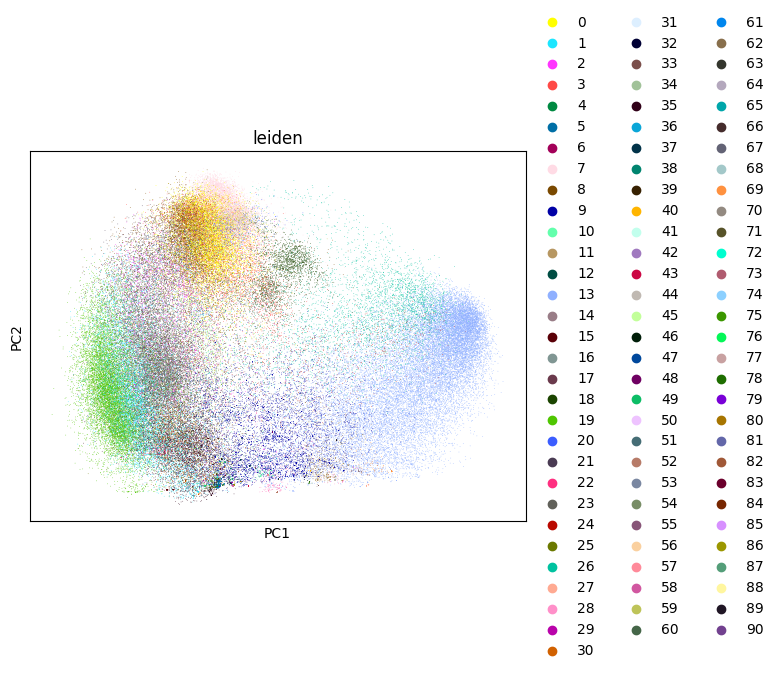

INFO:root:done for mouse: MouseZM_ZM5p2
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


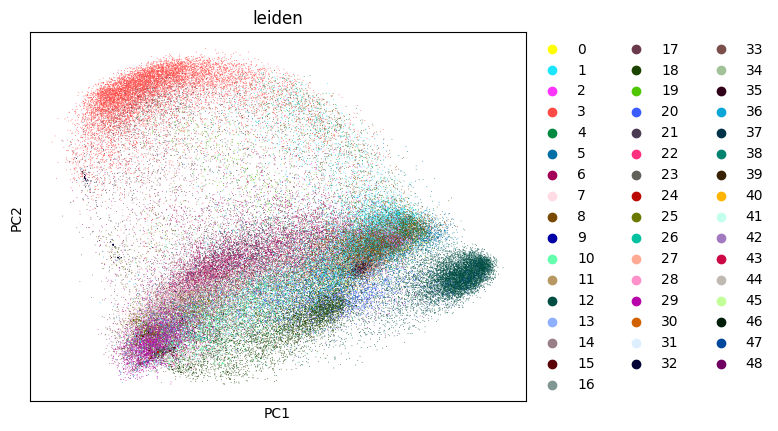

INFO:root:done for mouse: MouseZM_ZM6p1
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


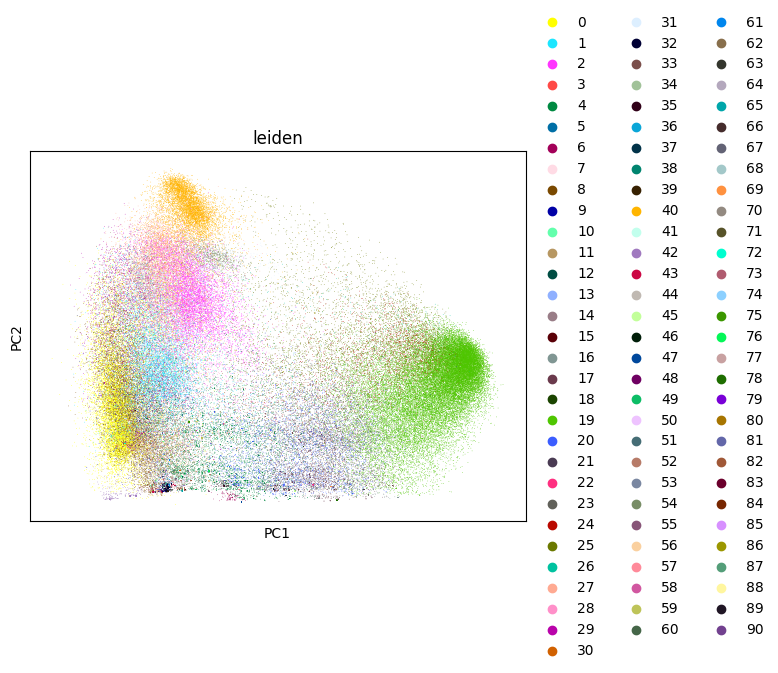

INFO:root:done for mouse: MouseZM_ZM7p1
/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


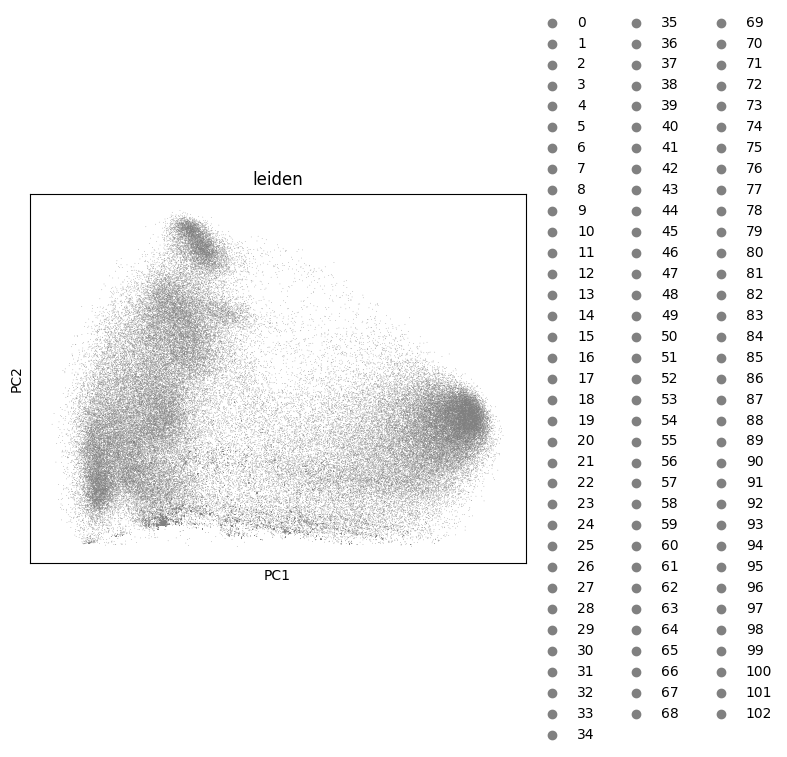

INFO:root:done for mouse: MouseZM_ZM7p2


In [30]:
verbose=False
for name_of_slice in name_of_slice_all:
    if name_of_slice in invalid_slices:
        continue;
    try:
        thisdircheck = (paths['data_root'] + name_of_slice + '/' + 'analyzed_data/*/region_*/')
        alltifregions = np.array([[s for s in m.split('/') if 'region' in s][0] for m in glob.glob(thisdircheck + '/images/*.tif')])
        values, counts = np.unique(alltifregions, return_counts=True)
        region_chosen = values[np.argmax(counts)]
        thisdircheck = (paths['data_root'] + name_of_slice + '/' + f'analyzed_data/*/{region_chosen}/')

        cell_loc_path = glob.glob(thisdircheck + 'cell_metadata.csv')[0]
        countmatrix_path = glob.glob(thisdircheck+'cell_by_gene.csv')[0]

        slice_id = cell_loc_path.split('/')[-3]    
        sc_factor_1,sc_factor_2, shift = scaling_factor(pix_tran_filepath = paths['data_root']+f'/pons_csvs/{slice_id}/{region_chosen}/images/micron_to_mosaic_pixel_transform.csv')

        foo = pd.read_csv(cell_loc_path, index_col=0).sort_index()
        cell_pos_orig = foo[['center_x','center_y']]*np.array((sc_factor_1,sc_factor_2)) + shift
        cell_pos = (foo[['center_x','center_y']]*np.array((sc_factor_1,sc_factor_2)) + shift)/globalscaling

        tif_img = get_tifimage(thisdircheck, globalscaling=32)
        adata_mer = run_denovo_cluster(countmatrix_path)
        save_filt_neuron_df(cell_pos_orig, adata_mer, outputfile=paths['code_root'] + f'/filt_neurons/filt_neurons_{name_of_slice}.csv', verbose=False)
        plot_jpg(cell_pos, adata_mer, tif_img, dpi=200, save_bool=True, savefilename=paths['code_root'] + f'/image_xml/cell_img_{name_of_slice}.jpg', verbose=False)
        create_image_xml(name_of_slice, width=tif_img.shape[0], height=tif_img.shape[1], save_destination=paths['code_root'], verbose=False)
        logging.info(f'done for mouse: {name_of_slice}')
    except Exception as e:
        logging.error(f'Error processing {name_of_slice}: {e}')